In [ ]:
import os
import cv2

In [ ]:
import sys
!{sys.executable} -m pip install opencv-python
!{sys.executable} -m pip install tensorflow
!{sys.executable} -m pip install matplotlib

In [ ]:
os.makedirs('./CRDD2022_all_countries', exist_ok=True)

In [ ]:
ALL_2022 = {'Japan': 'https://bigdatacup.s3.ap-northeast-1.amazonaws.com/2022/CRDDC2022/RDD2022/Country_Specific_Data_CRDDC2022/RDD2022_Japan.zip',
            'India': 'https://bigdatacup.s3.ap-northeast-1.amazonaws.com/2022/CRDDC2022/RDD2022/Country_Specific_Data_CRDDC2022/RDD2022_India.zip',
            'Czech': 'https://bigdatacup.s3.ap-northeast-1.amazonaws.com/2022/CRDDC2022/RDD2022/Country_Specific_Data_CRDDC2022/RDD2022_Czech.zip',
            'Norway': 'https://bigdatacup.s3.ap-northeast-1.amazonaws.com/2022/CRDDC2022/RDD2022/Country_Specific_Data_CRDDC2022/RDD2022_Norway.zip',
            'United_States': 'https://bigdatacup.s3.ap-northeast-1.amazonaws.com/2022/CRDDC2022/RDD2022/Country_Specific_Data_CRDDC2022/RDD2022_United_States.zip',
            'China_MotorBike': 'https://bigdatacup.s3.ap-northeast-1.amazonaws.com/2022/CRDDC2022/RDD2022/Country_Specific_Data_CRDDC2022/RDD2022_China_MotorBike.zip',
            'China_Drone': 'https://bigdatacup.s3.ap-northeast-1.amazonaws.com/2022/CRDDC2022/RDD2022/Country_Specific_Data_CRDDC2022/RDD2022_China_Drone.zip'}

import urllib.request
from tqdm import tqdm
print('Dowload Stage')
for country_name, url in tqdm(ALL_2022.items()):
    urllib.request.urlretrieve(url, f'./CRDD2022_all_countries/{country_name}.zip')

Dowload Stage


100%|██████████| 7/7 [03:07<00:00, 26.78s/it]


In [ ]:
import zipfile
import shutil
all_file = "Collect_File/"

In [ ]:
#unzip all of the file
os.makedirs('./Collect_File',exist_ok=True)
dict = "CRDD2022_all_countries/"

for file in os.listdir(dict):
    file_path = os.path.join(dict,file)

    if file.endswith(".zip"):
        with zipfile.ZipFile(file_path,"r") as zip:
            zip.extractall("Collect_File")
            print(f"file {file} have been unzip")

file Czech.zip have been unzip
file India.zip have been unzip
file United_States.zip have been unzip
file China_MotorBike.zip have been unzip
file Norway.zip have been unzip
file Japan.zip have been unzip
file China_Drone.zip have been unzip


In [ ]:
import os
import sys
import xml.etree.ElementTree as ET
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as pt
import tqdm
import pandas as pd

In [ ]:
def get_image_counts(all_file):
    # TRAIN IMAGES
    folder_name = []
    folder_capacity_train = []
    folder_capacity_test = []
    total_data = []

    for file in os.listdir(all_file):
        file_path_train = os.path.join(all_file, file, "train", "images")
        if os.path.isdir(file_path_train):
            #print(f"Folder {file} (train) loading")

            img_count_train = 0
            for img_name_train in os.listdir(file_path_train):
                img_path_train = os.path.join(file_path_train, img_name_train)
                if img_path_train.lower().endswith(('.png', '.jpg', '.jpeg')):
                    img_count_train += 1

            folder_name.append(file)
            folder_capacity_train.append(img_count_train)

        file_path_test = os.path.join(all_file, file, "test", "images")
        if os.path.isdir(file_path_test):
            #print(f"Folder {file} (test) loading")

            img_count_test = 0
            for img_name_test in os.listdir(file_path_test):
                img_path_test = os.path.join(file_path_test, img_name_test)
                img_count_test += 1
        else:
            img_count_test = 0
        folder_capacity_test.append(img_count_test)


        total_data.append(img_count_train + img_count_test)


    return folder_name, folder_capacity_train, folder_capacity_test, total_data


In [ ]:
import numpy as np

def show_histogram(folder_name, folder_capacity_train, folder_capacity_test, total_data):
    plt.figure(figsize=(12, 6))

    x = np.arange(len(folder_name))

    width = 0.25

    plt.bar(x - width, folder_capacity_test, width=width, label='Test Images', color='red')
    plt.bar(x, folder_capacity_train, width=width, label='Train Images', color='darkblue')
    plt.bar(x + width, total_data, width=width, label='Total Images', color='yellow')

    plt.title('CRDD2022 Dataset')
    plt.xlabel('Countries')
    plt.ylabel('Number of Images')

    plt.xticks(x, folder_name, rotation=45, ha='right')
    plt.legend()
    plt.tight_layout()
    plt.show()



In [ ]:

folder_name, folder_capacity_train, folder_capacity_test, total_data = get_image_counts(all_file)

print("Folder Name:", folder_name)
print("Train Images:", folder_capacity_train)
print("Test Images:", folder_capacity_test)
print("Total Data:", total_data)

Folder Name: ['China_Drone', 'India', 'Norway', 'Japan', 'Czech', 'China_MotorBike', 'United_States']
Train Images: [2401, 7706, 8161, 10506, 2829, 1977, 4805]
Test Images: [0, 1959, 2040, 2627, 709, 500, 1200]
Total Data: [2401, 9665, 10201, 13133, 3538, 2477, 6005]


In [ ]:
TYPE = ["D00","D10","D20","D40"]
_all_test={}
_trial_value ={}

In [ ]:
def get_all_xml():
    _allFILE = "Collect_File/"
#   get_and_STOREDATA
    _all_test = {
        "file_name": [],
        "images": [],
        "height": [],
        "width": [],
        "detect": [],
    }

    stats = {
        'x': [],
        'y': [],
        'h': [],
        'w': [],

    }

    _trial_value = {
        "images": [],
        "type": []
    }

    for _allnameFILE in os.listdir(_allFILE):
        _allnameFILElink = os.path.join(_allFILE,_allnameFILE + "/train/annotations/xmls")
        print(f"FILE {_allnameFILE} loading...")

        for _allfile in os.listdir(_allnameFILElink):
            __xmlfile = os.path.join(_allnameFILElink,_allfile)
            tree = ET.parse(__xmlfile)

            #   made file name...
            _all_test["file_name"].append(_allnameFILE)
            _all_test["images"].append(tree.find("filename").text)
            _all_test["height"].append(int(tree.find("size").find("height").text))
            _all_test["width"].append(int(tree.find("size").find("width").text))

            _tmp = []

            #   add for all of the object that is valid for all the detections
            for object in tree.findall("object"):
                _type = object.find("name").text
                bbox = object.find("bndbox")
                xmin = float(bbox.find("xmin").text)
                ymin = float(bbox.find("ymin").text)
                xmax = float(bbox.find("xmax").text)
                ymax = float(bbox.find("ymax").text)
                x_center = (float(xmin + xmax) / 2) / _all_test["width"][-1]
                y_center = (float(ymin + ymax) / 2) / _all_test["height"][-1]
                w = (xmax - xmin) / _all_test["width"][-1]
                h = (ymax - ymin) / _all_test["height"][-1]

                stats["x"].append(x_center)
                stats["y"].append(y_center)
                stats["h"].append(h)
                stats["w"].append(w)


                obj = {
                    "type": _type,
                    "x": x_center,
                    "y": y_center,
                    "w": w,
                    "h": h,
                }

                if _type not in _trial_value["type"]:
                    _trial_value["images"].append(_all_test["images"][-1])
                    _trial_value["type"].append(_type)

                _tmp.append(obj)

            _all_test["detect"].append(_tmp)

    return _all_test,_trial_value, stats

In [ ]:
def get_img(file_name,train):
    _type = file_name.split('_')[0]
    _next = file_name.split('_')[1]
    if _type == "China" or _type == "United":
        _type = _type + '_' + _next
    path = f"Collect_File/{_type}/{train}/images/{file_name}"
    try:
        img = cv2.imread(path)
    except:
        print(f"file {file_name} is not found !")
    return img

In [ ]:
def show_img(file_name,_all_tests):
    img = get_img(file_name,"train")
    fig,ax = plt.subplots()
    ax.imshow(img)

    index = _all_tests["images"].index(file_name)

    # Draw boxes
    _BOXES = _all_tests["detect"][index]
    h = _all_tests["height"][index]
    w = _all_tests["width"][index]

    for _BOX in _BOXES:
        x_start = w * (_BOX["x"] - _BOX["w"] / 2)
        y_start = h * (_BOX["y"] - _BOX["h"] / 2)

        rectangle = pt.Rectangle(
            (x_start, y_start), _BOX["w"]*w, _BOX["h"]*h,
            linewidth=2, edgecolor='blue', facecolor='none'
        )
        ax.add_patch(rectangle)
        ax.text(x_start, y_start - 5, _BOX["type"], color='blue', fontsize=10, verticalalignment='bottom', bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))
    plt.xlabel("X-axis")
    plt.ylabel("Y-axis")
    plt.title(file_name)
    plt.grid()
    plt.show()

In [ ]:
def print_the_trial_value(trial_value):
  for image, _type in trial_value.items():
    print(f"{image}, {_type}")

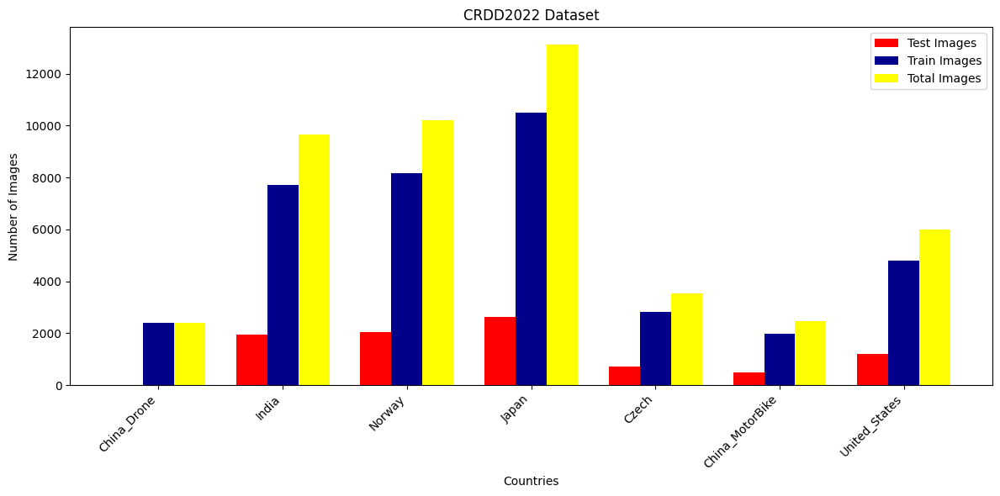

In [ ]:
show_histogram(folder_name, folder_capacity_train, folder_capacity_test, total_data)

In [ ]:
_allXML,trial, stats = get_all_xml()

FILE China_Drone loading...
FILE India loading...
FILE Norway loading...
FILE Japan loading...
FILE Czech loading...
FILE China_MotorBike loading...
FILE United_States loading...


In [ ]:
print(type(trial))
print(trial)

<class 'dict'>
{'images': ['China_Drone_001832.jpg', 'China_Drone_001385.jpg', 'China_Drone_000855.jpg', 'China_Drone_001428.jpg', 'China_Drone_000503.jpg', 'China_Drone_001680.jpg', 'India_006824.jpg', 'India_001146.jpg', 'India_003695.jpg', 'India_003728.jpg', 'India_007200.jpg', 'India_006389.jpg'], 'type': ['D10', 'D00', 'Repair', 'D20', 'D40', 'Block crack', 'D44', 'D01', 'D11', 'D43', 'D50', 'D0w0']}


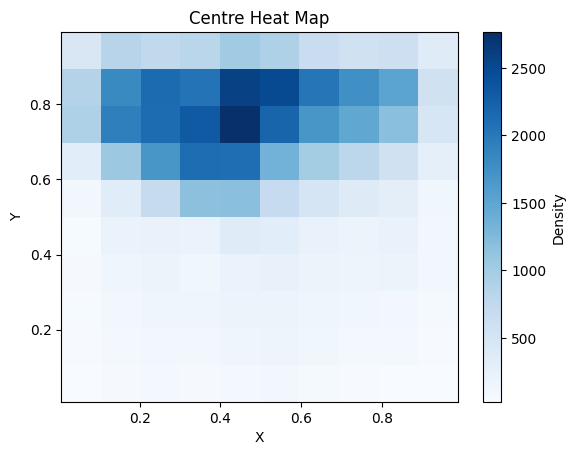

In [ ]:
# plot the heatmap for the centre
plt.hist2d(stats['x'],stats['y'],cmap = 'Blues')
plt.colorbar(label='Density')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Centre Heat Map')
plt.show()

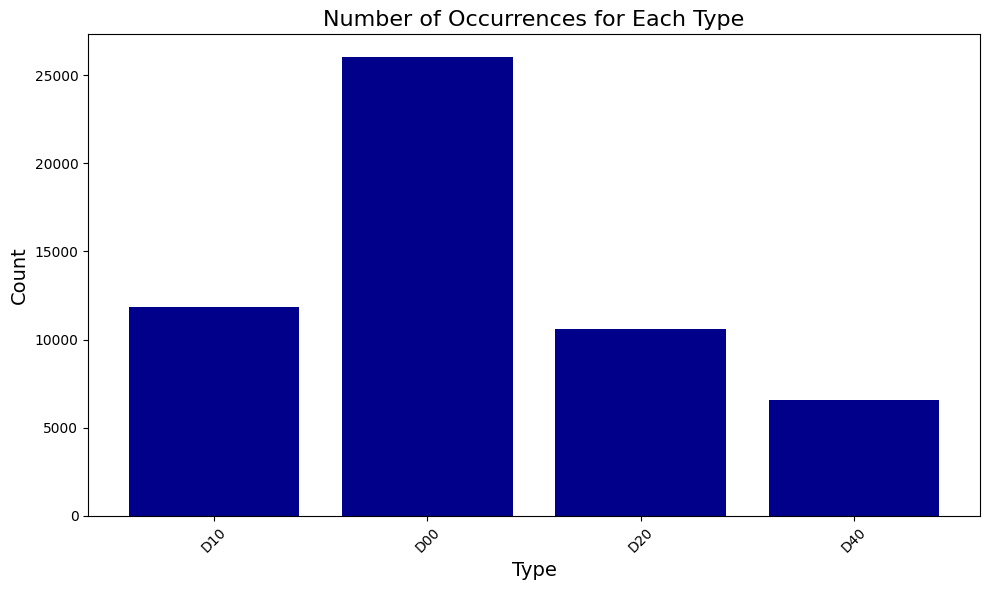

In [ ]:
import matplotlib.pyplot as plt
from collections import Counter

type_counts = Counter()

for detect in _allXML["detect"]:
    for obj in detect:
        if obj["type"] in TYPE:
            type_counts[obj["type"]] += 1

types = list(type_counts.keys())
counts = list(type_counts.values())

plt.figure(figsize=(10, 6))
plt.bar(types, counts, color='darkblue')
plt.xlabel("Type", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.title("Number of Occurrences for Each Type", fontsize=16)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as pt

{'type': 'D00', 'x': 0.11328125, 'y': 0.5009765625, 'w': 0.1015625, 'h': 0.998046875}


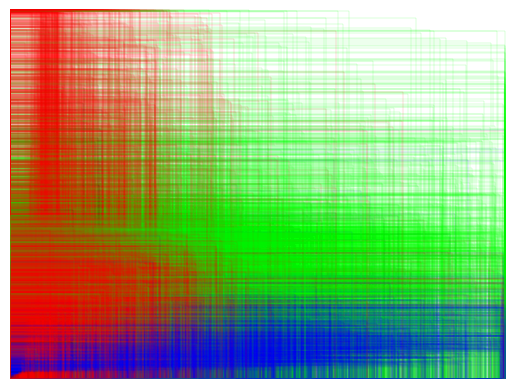

In [ ]:
color = {
    "D00": (1.0, 0.0, 0.0, 1.0),  # Red with full opacity
    "D10": (0.0, 0.0, 1.0, 1.0),  # Blue with full opacity
    "D20": (0.0, 1.0, 0.0, 1.0),  # Yellow with full opacity
    "D40": (0.0, 0.0, 0.0, 1.0),  # Black with full opacity
}

fig,ax = plt.subplots()
bboxss = _allXML['detect']
print(bboxss[1][0])



for bboxs in bboxss:
    for bbox in bboxs:
        type = bbox['type']
        rec = pt.Rectangle(
            (0,0),
            bbox['w'],
            bbox['h'],
            linewidth=0.1, edgecolor=color[type], facecolor='none',
            fill=False
        )
        ax.add_patch(rec)


ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.axis('off')

# Show the plot
plt.show()

In [ ]:
def visualize_distributions(train_images):
    x_coords, y_coords = [], []
    widths, heights = [], []

    for data_entry in train_images:
        _BOXES = data_entry["boxes"]

        for _BOX in _BOXES:
            x_coords.append(_BOX["x_center"])
            y_coords.append(_BOX["y_center"])
            widths.append(_BOX["width"])
            heights.append(_BOX["height"])

    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    axs[0].hist2d(x_coords, y_coords, bins=50, cmap="Blues")
    axs[0].set_title("Distribution of Bounding Box Centers")
    axs[0].set_xlabel("x")
    axs[0].set_ylabel("y")
    axs[0].set_xlim(0, 1)
    axs[0].set_ylim(0, 1)
    axs[0].invert_yaxis()
    axs[0].grid(color="lightgray", linestyle="--", linewidth=0.5)

    axs[1].hist2d(widths, heights, bins=50, cmap="Blues")
    axs[1].set_title("Distribution of Bounding Box Sizes")
    axs[1].set_xlabel("width")
    axs[1].set_ylabel("height")
    axs[1].set_xlim(0, 1)
    axs[1].set_ylim(0, 1)
    axs[1].grid(color="lightgray", linestyle="--", linewidth=0.5)

    plt.tight_layout()
    plt.show()

In [ ]:
def get_xml(file_name, dest_dir):
    _type = file_name.split('_')[0]
    _next = file_name.split('_')[1]
    if _type == "China" or _type == "United":
        _type = _type + '_' + _next

    path = f"Collect_File/{_type}/train/annotations/xmls/{file_name}.xml"
    tree = ET.parse(path)
    h = int(tree.find("size").find("height").text)
    w = int(tree.find("size").find("width").text)
    converted_files = []
    result = []

    # Cờ để kiểm tra đã in _type và class_id chưa
    printed_types = set()

    for obj in tree.findall("object"):
        _type = obj.find("name").text
        if _type in TYPE:
            bbox = obj.find("bndbox")

            xmin = float(bbox.find("xmin").text)
            ymin = float(bbox.find("ymin").text)
            xmax = float(bbox.find("xmax").text)
            ymax = float(bbox.find("ymax").text)
            x_center = (float(xmin + xmax) / 2) / w
            y_center = (float(ymin + ymax) / 2) / h
            ws = (xmax - xmin) / w
            hs = (ymax - ymin) / h

            class_id = TYPE.index(_type)

            # In _type và class_id chỉ một lần duy nhất
            if _type not in printed_types:
                print(f"Class ID: {class_id}, Type: {_type}")  # In ra class_id và _type
                printed_types.add(_type)  # Đánh dấu là đã in

            result.append(f"{class_id} {x_center} {y_center} {ws} {hs}")

            converted_file = os.path.join(dest_dir, f"{file_name}.txt")
            with open(converted_file, "w", encoding="utf-8") as f:
                f.write("\n".join(result))

            converted_files.append(converted_file)

    return converted_files

def get_img_path(file_name):
    _type = file_name.split('_')[0]
    _next = file_name.split('_')[1]
    if _type == "China" or _type == "United":
        _type = _type + '_' + _next
    path = f"Collect_File/{_type}/train/images/{file_name}"
    return path

In [ ]:
import matplotlib.patches as patches

def visualize_bounding_boxes_overlay(train_images):
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_title("Bounding Boxes Overlay", fontsize=16)
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.invert_yaxis()

    class_colors = {
        0: "blue",    # Class 0
        1: "cyan",    # Class 1
        2: "gray",    # Class 2
        3: "teal",    # Class 3
    }

    for data_entry in train_images:
        file_name = data_entry["file_name"]
        _BOXES = data_entry["boxes"]

        for _BOX in _BOXES:
            x_start = _BOX["x_center"] - _BOX["width"] / 2
            y_start = _BOX["y_center"] - _BOX["height"] / 2
            width = _BOX["width"]
            height = _BOX["height"]
            class_id = _BOX.get("class_id", -1)

            color = class_colors.get(class_id, "skyblue")


            rectangle = patches.Rectangle(
                (x_start, y_start), width, height,
                linewidth=0.5, edgecolor=color, facecolor="none", alpha=0.5
            )
            ax.add_patch(rectangle)

    plt.grid(color='lightgray', linestyle='--', linewidth=0.5)
    plt.show()

In [ ]:
#   Using sklearn elements for train_valid_test split
import sklearn
from sklearn.model_selection import train_test_split
import pandas as pd

In [ ]:
#   Shuffle The Data
_allXML["detect"] = [[x for x in inner_list if x["type"] in TYPE] for inner_list in _allXML["detect"]]
print(len(_allXML["detect"]))

Data_df = pd.DataFrame({
        "file_name": _allXML["file_name"],
        "images": _allXML["images"],
        "height": _allXML["height"],
        "width": _allXML["width"],
    })

Label_df = _allXML["detect"]

38385


In [ ]:
# ONLY USE FOR DEMO
X_train, X_test, y_train, y_test = train_test_split(Data_df,Label_df,test_size=0.9,shuffle=True,random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train,y_train,test_size=0.2,shuffle=True,random_state=42)

In [ ]:
# DEMO CODE
input_dir = "Collect_Data_mini"
os.makedirs(input_dir)
os.makedirs(os.path.join(input_dir, "images", "train"), exist_ok=True)
os.makedirs(os.path.join(input_dir, "images", "val"), exist_ok=True)
os.makedirs(os.path.join(input_dir, "labels", "train"), exist_ok=True)
os.makedirs(os.path.join(input_dir, "labels", "val"), exist_ok=True)

In [ ]:
dest_dir = os.path.join("./Collect_Data_mini", "labels", "train")
print(dest_dir)

for idx,row in X_train.iterrows():
    get_xml(row["images"].split('.')[0],dest_dir)

dest_dir = os.path.join("./Collect_Data_mini", "labels", "val")
print(dest_dir)

for idx,row in X_val.iterrows():
    get_xml(row["images"].split('.')[0],dest_dir)

./Collect_Data_mini/labels/train
Class ID: 3, Type: D40
Class ID: 2, Type: D20
Class ID: 1, Type: D10
Class ID: 0, Type: D00
Class ID: 2, Type: D20
Class ID: 3, Type: D40
Class ID: 0, Type: D00
Class ID: 1, Type: D10
Class ID: 0, Type: D00
Class ID: 1, Type: D10
Class ID: 2, Type: D20
Class ID: 0, Type: D00
Class ID: 3, Type: D40
Class ID: 0, Type: D00
Class ID: 2, Type: D20
Class ID: 0, Type: D00
Class ID: 2, Type: D20
Class ID: 0, Type: D00
Class ID: 2, Type: D20
Class ID: 0, Type: D00
Class ID: 1, Type: D10
Class ID: 0, Type: D00
Class ID: 0, Type: D00
Class ID: 0, Type: D00
Class ID: 2, Type: D20
Class ID: 0, Type: D00
Class ID: 2, Type: D20
Class ID: 0, Type: D00
Class ID: 2, Type: D20
Class ID: 0, Type: D00
Class ID: 2, Type: D20
Class ID: 1, Type: D10
Class ID: 0, Type: D00
Class ID: 1, Type: D10
Class ID: 0, Type: D00
Class ID: 1, Type: D10
Class ID: 3, Type: D40
Class ID: 0, Type: D00
Class ID: 0, Type: D00
Class ID: 0, Type: D00
Class ID: 1, Type: D10
Class ID: 0, Type: D00
C

In [ ]:
import shutil

dest_dir = os.path.join("./Collect_Data_mini", "images", "train")
print(dest_dir)

for idx,row in X_train.iterrows():
    shutil.move(get_img_path(row["images"]),dest_dir)

dest_dir = os.path.join("./Collect_Data_mini", "images", "val")
print(dest_dir)

for idx,row in X_val.iterrows():
    shutil.move(get_img_path(row["images"]),dest_dir)

./Collect_Data_mini/images/train
./Collect_Data_mini/images/val


In [ ]:
print(_allXML)

{'file_name': ['Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norway', 'Norw

In [ ]:
def get_all_yolo_data():
    label_dir = "Collect_Data_mini/labels/train"
    all_data = []

    if not os.path.exists(label_dir):
        print(f"Label directory {label_dir} does not exist.")
        return all_data

    for file_name in os.listdir(label_dir):
        file_path = os.path.join(label_dir, file_name)
        data_entry = {"file_name": file_name, "boxes": []}

        try:
            if os.stat(file_path).st_size == 0:
                print(f"Skipping empty file: {file_name}")
                continue

            with open(file_path, "r") as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) == 5:  # Đúng định dạng YOLO
                        class_id, x_center, y_center, width, height = map(float, parts)
                        data_entry["boxes"].append({
                            "class_id": int(class_id),
                            "x_center": x_center,
                            "y_center": y_center,
                            "width": width,
                            "height": height,
                        })

            all_data.append(data_entry)
        except Exception as e:
            print(f"Error processing {file_name}: {e}")
            continue

    return all_data


In [ ]:
train_images = get_all_yolo_data()

In [ ]:
for data_entry in train_images[:5]:  # In thử 5 phần tử đầu tiên
    print(data_entry)

{'file_name': 'United_States_003294.txt', 'boxes': [{'class_id': 1, 'x_center': 0.50625, 'y_center': 0.76875, 'width': 0.084375, 'height': 0.01875}, {'class_id': 0, 'x_center': 0.46796875, 'y_center': 0.7421875, 'width': 0.0203125, 'height': 0.040625}, {'class_id': 0, 'x_center': 0.5859375, 'y_center': 0.87265625, 'width': 0.078125, 'height': 0.2390625}]}
{'file_name': 'United_States_001644.txt', 'boxes': [{'class_id': 1, 'x_center': 0.22421875, 'y_center': 0.87421875, 'width': 0.4421875, 'height': 0.1046875}]}
{'file_name': 'Norway_006245.txt', 'boxes': [{'class_id': 0, 'x_center': 0.04083972602739726, 'y_center': 0.8950097847358122, 'width': 0.08134520547945205, 'height': 0.1309784735812133}]}
{'file_name': 'Japan_001591.txt', 'boxes': [{'class_id': 0, 'x_center': 0.51, 'y_center': 0.72, 'width': 0.04, 'height': 0.09666666666666666}, {'class_id': 0, 'x_center': 0.5141666666666667, 'y_center': 0.8291666666666667, 'width': 0.035, 'height': 0.07166666666666667}]}
{'file_name': 'Czech_00

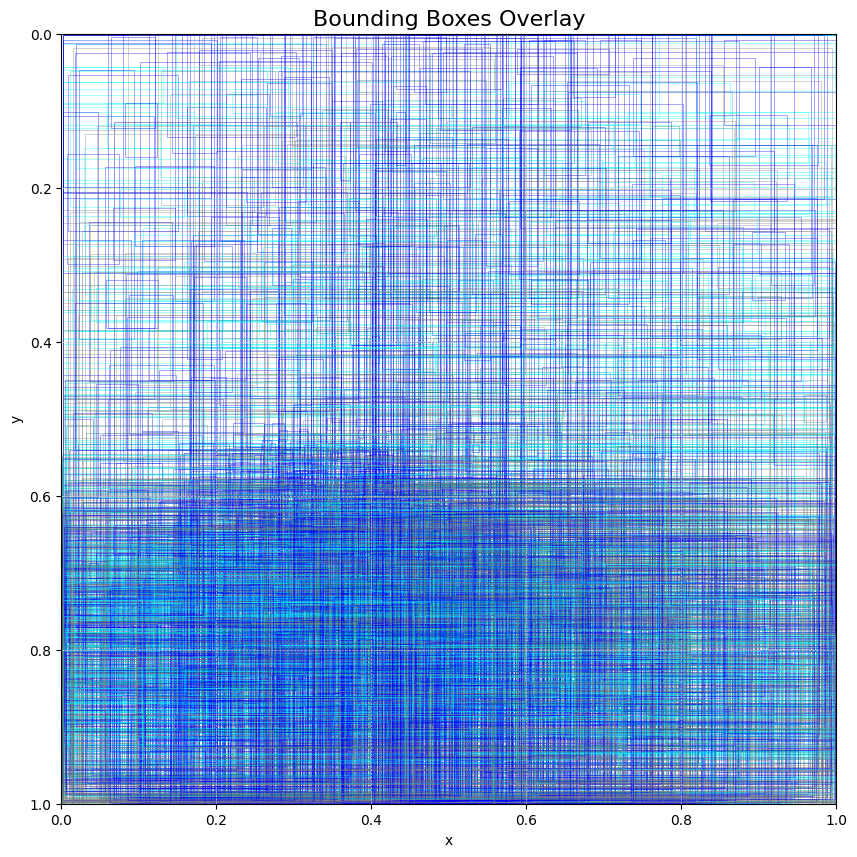

In [ ]:
visualize_bounding_boxes_overlay(train_images)

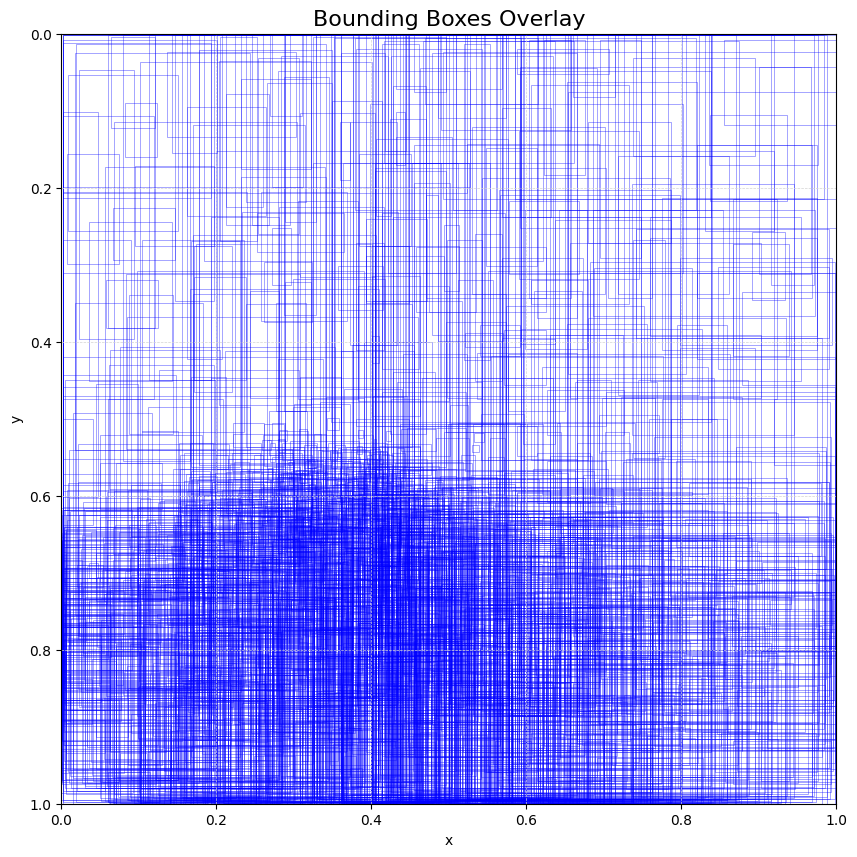

In [ ]:
def onlyD00(train_images):
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_title("Bounding Boxes Overlay", fontsize=16)
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.invert_yaxis()

    class_colors = {
        0: "blue",    # Class 0
    }

    for data_entry in train_images:
        file_name = data_entry["file_name"]
        _BOXES = data_entry["boxes"]


        for _BOX in _BOXES:

            x_start = _BOX["x_center"] - _BOX["width"] / 2
            y_start = _BOX["y_center"] - _BOX["height"] / 2
            width = _BOX["width"]
            height = _BOX["height"]
            class_id = _BOX.get("class_id", 0)


            if class_id == 0:

                color = class_colors.get(class_id, "blue")

                rectangle = patches.Rectangle(
                    (x_start, y_start), width, height,
                    linewidth=0.5, edgecolor=color, facecolor="none", alpha=0.5
                )
                ax.add_patch(rectangle)

    plt.grid(color='lightgray', linestyle='--', linewidth=0.5)
    plt.show()

onlyD00(train_images)

Total number of bounding boxes for D00: 2031
Width/Height ratio - Mean: 0.6946, Std: 0.6040, Min: 0.0207, Max: 12.2478


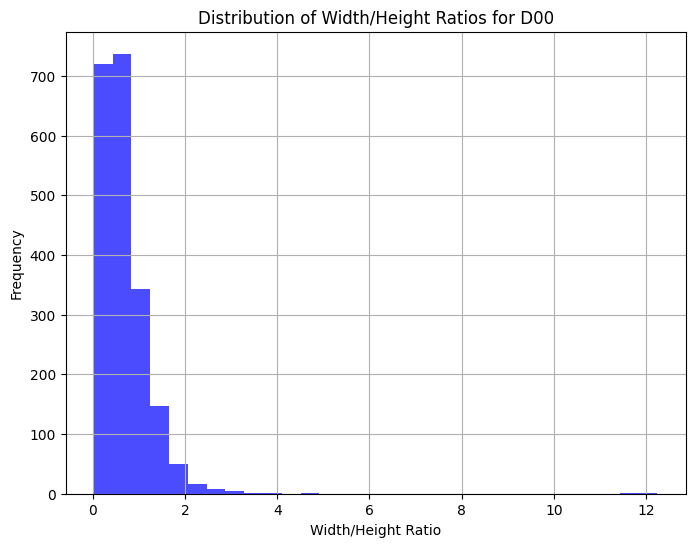

In [ ]:
def onlyD00_ratio(train_images):
    width_height_ratios = []

    for data_entry in train_images:
        _BOXES = data_entry["boxes"]

        for _BOX in _BOXES:
            class_id = _BOX.get("class_id", -1)

            if class_id == 0:
                width = _BOX["width"]
                height = _BOX["height"]
                ratio = width / height if height != 0 else 0
                width_height_ratios.append(ratio)

    width_height_ratios = np.array(width_height_ratios)

    print(f"Total number of bounding boxes for D00: {len(width_height_ratios)}")
    print(f"Width/Height ratio - Mean: {np.mean(width_height_ratios):.4f}, Std: {np.std(width_height_ratios):.4f}, Min: {np.min(width_height_ratios):.4f}, Max: {np.max(width_height_ratios):.4f}")

    plt.figure(figsize=(8, 6))
    plt.hist(width_height_ratios, bins=30, color='blue', alpha=0.7)
    plt.title('Distribution of Width/Height Ratios for D00')
    plt.xlabel('Width/Height Ratio')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

onlyD00_ratio(train_images)


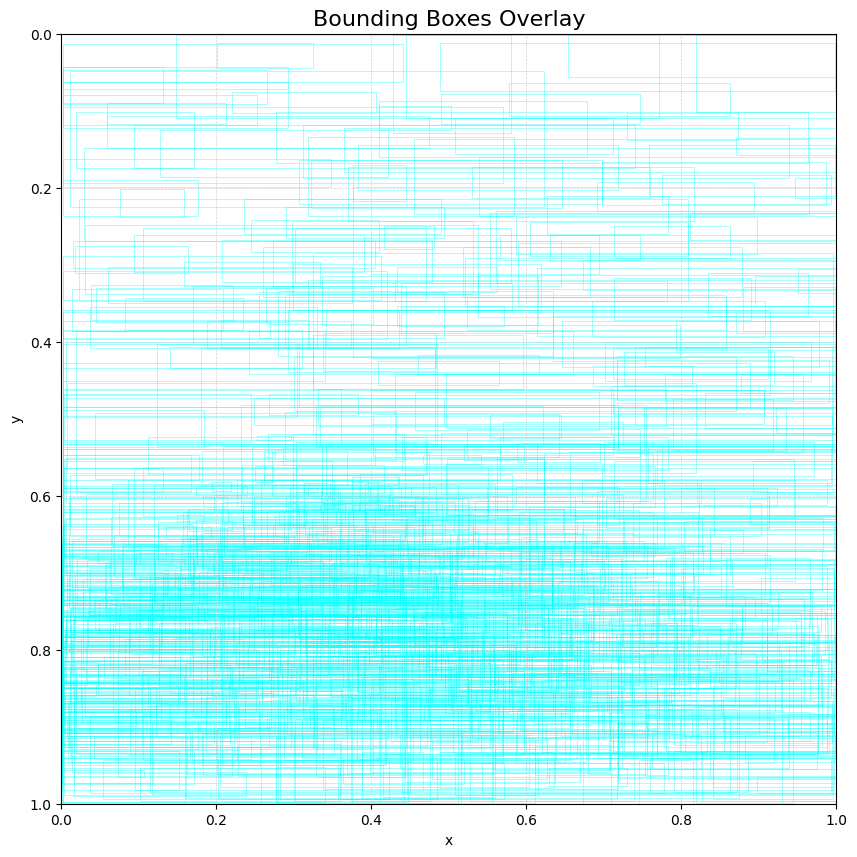

In [ ]:
def onlyD10(train_images):
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_title("Bounding Boxes Overlay", fontsize=16)
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.invert_yaxis()

    class_colors = {
        1: "cyan",    # Color for class 1
    }

    for data_entry in train_images:
        file_name = data_entry["file_name"]
        _BOXES = data_entry["boxes"]

        for _BOX in _BOXES:
            x_start = _BOX["x_center"] - _BOX["width"] / 2
            y_start = _BOX["y_center"] - _BOX["height"] / 2
            width = _BOX["width"]
            height = _BOX["height"]
            class_id = _BOX.get("class_id", -1)

            if class_id == 1:
                color = class_colors.get(class_id, "cyan")

                rectangle = patches.Rectangle(
                    (x_start, y_start), width, height,
                    linewidth=0.5, edgecolor=color, facecolor="none", alpha=0.5
                )
                ax.add_patch(rectangle)

    plt.grid(color='lightgray', linestyle='--', linewidth=0.5)
    plt.show()
onlyD10(train_images)


Total number of bounding boxes for D10: 977
Width/Height ratio - Mean: 5.4889, Std: 2.7512, Min: 0.2410, Max: 20.2050


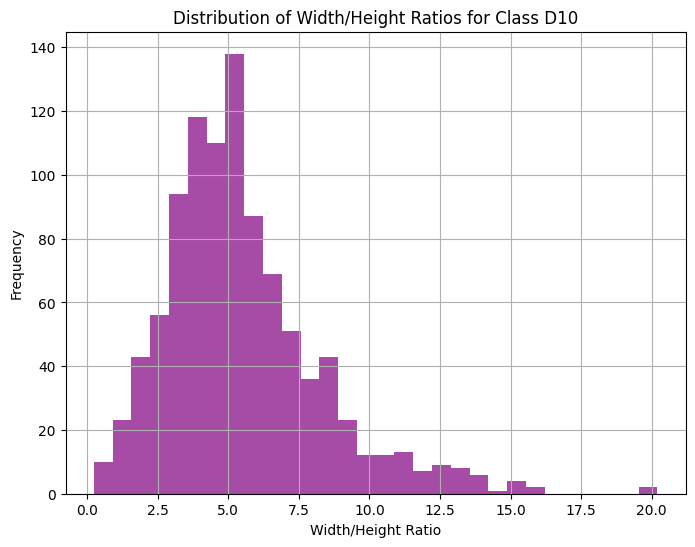

In [ ]:
import numpy as n

def onlyD10_ratio(train_images):
    width_height_ratios = []

    for data_entry in train_images:
        _BOXES = data_entry["boxes"]

        for _BOX in _BOXES:
            class_id = _BOX.get("class_id", -1)

            if class_id == 1:
                width = _BOX["width"]
                height = _BOX["height"]
                ratio = width / height if height != 0 else 0  # Kiểm tra chia cho 0

                width_height_ratios.append(ratio)

    width_height_ratios = np.array(width_height_ratios)

    print(f"Total number of bounding boxes for D10: {len(width_height_ratios)}")
    print(f"Width/Height ratio - Mean: {np.mean(width_height_ratios):.4f}, Std: {np.std(width_height_ratios):.4f}, Min: {np.min(width_height_ratios):.4f}, Max: {np.max(width_height_ratios):.4f}")

    plt.figure(figsize=(8, 6))
    plt.hist(width_height_ratios, bins=30, color='purple', alpha=0.7)
    plt.title('Distribution of Width/Height Ratios for Class D10')
    plt.xlabel('Width/Height Ratio')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

onlyD10_ratio(train_images)


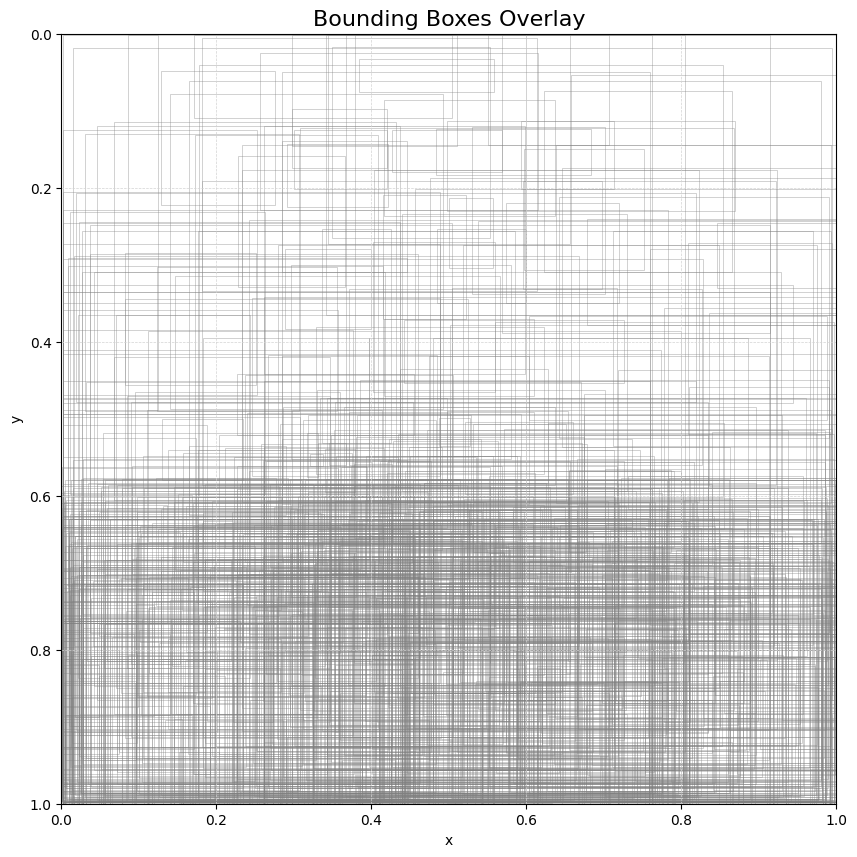

In [ ]:
def onlyD20(train_images):
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_title("Bounding Boxes Overlay", fontsize=16)
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.invert_yaxis()

    class_colors = {
        2: "gray",
    }

    for data_entry in train_images:
        file_name = data_entry["file_name"]
        _BOXES = data_entry["boxes"]

        for _BOX in _BOXES:
            x_start = _BOX["x_center"] - _BOX["width"] / 2
            y_start = _BOX["y_center"] - _BOX["height"] / 2
            width = _BOX["width"]
            height = _BOX["height"]
            class_id = _BOX.get("class_id", -1)

            if class_id == 2:
                color = class_colors.get(class_id, "gray")

                rectangle = patches.Rectangle(
                    (x_start, y_start), width, height,
                    linewidth=0.5, edgecolor=color, facecolor="none", alpha=0.5
                )
                ax.add_patch(rectangle)

    plt.grid(color='lightgray', linestyle='--', linewidth=0.5)
    plt.show()

onlyD20(train_images)

Total number of bounding boxes for D20: 853
Width/Height ratio - Mean: 1.6335, Std: 1.0036, Min: 0.1928, Max: 7.5417


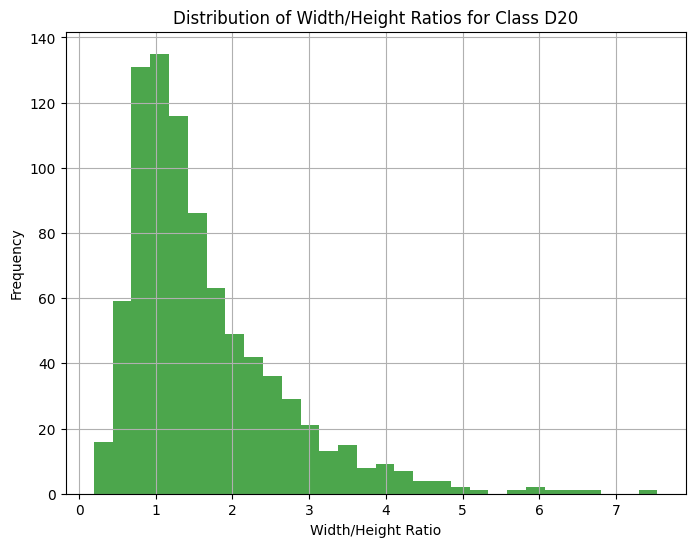

In [ ]:
def onlyD20_ratio(train_images):
    width_height_ratios = []

    for data_entry in train_images:
        _BOXES = data_entry["boxes"]

        for _BOX in _BOXES:
            class_id = _BOX.get("class_id", -1)

            if class_id == 2:
                width = _BOX["width"]
                height = _BOX["height"]
                ratio = width / height if height != 0 else 0
                width_height_ratios.append(ratio)

    width_height_ratios = np.array(width_height_ratios)

    print(f"Total number of bounding boxes for D20: {len(width_height_ratios)}")
    print(f"Width/Height ratio - Mean: {np.mean(width_height_ratios):.4f}, Std: {np.std(width_height_ratios):.4f}, Min: {np.min(width_height_ratios):.4f}, Max: {np.max(width_height_ratios):.4f}")

    plt.figure(figsize=(8, 6))
    plt.hist(width_height_ratios, bins=30, color='green', alpha=0.7)
    plt.title('Distribution of Width/Height Ratios for Class D20')
    plt.xlabel('Width/Height Ratio')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

onlyD20_ratio(train_images)


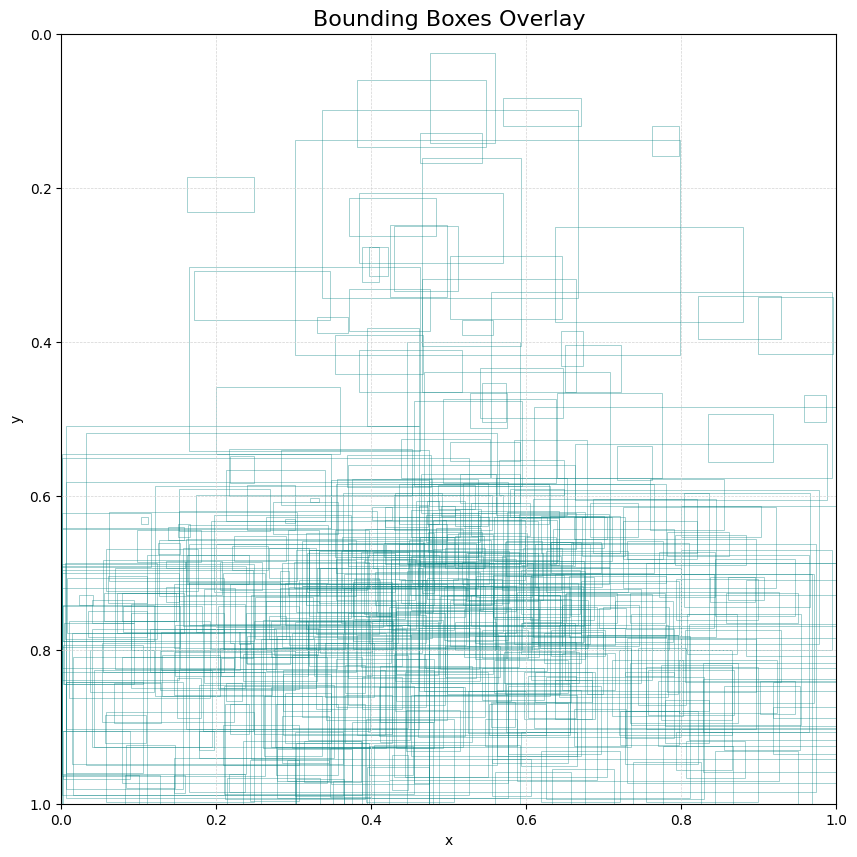

In [ ]:
def onlyD40(train_images):
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_title("Bounding Boxes Overlay", fontsize=16)
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.invert_yaxis()

    class_colors = {
        3: "teal",
    }

    for data_entry in train_images:
        file_name = data_entry["file_name"]
        _BOXES = data_entry["boxes"]

        for _BOX in _BOXES:
            x_start = _BOX["x_center"] - _BOX["width"] / 2
            y_start = _BOX["y_center"] - _BOX["height"] / 2
            width = _BOX["width"]
            height = _BOX["height"]
            class_id = _BOX.get("class_id", -1)

            if class_id == 3:
                color = class_colors.get(class_id, "teal")

                rectangle = patches.Rectangle(
                    (x_start, y_start), width, height,
                    linewidth=0.5, edgecolor=color, facecolor="none", alpha=0.5
                )
                ax.add_patch(rectangle)

    plt.grid(color='lightgray', linestyle='--', linewidth=0.5)
    plt.show()

onlyD40(train_images)

Total number of bounding boxes for D40: 479
Width/Height ratio - Mean: 1.7001, Std: 0.7935, Min: 0.3218, Max: 6.8788


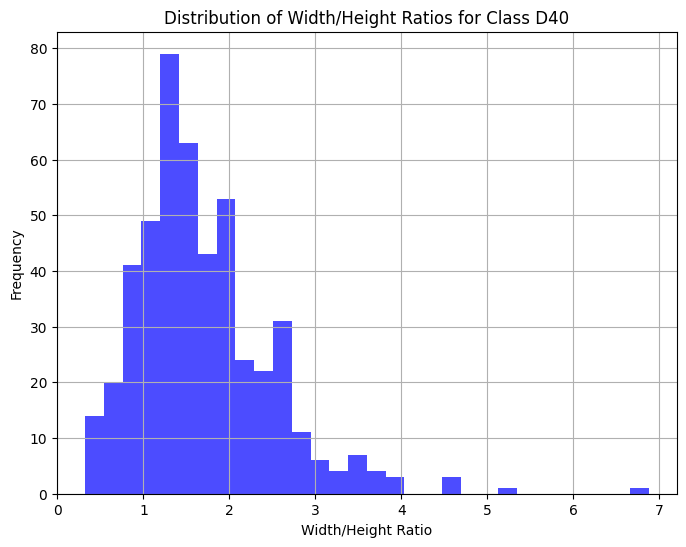

In [ ]:
def onlyD40_ratio(train_images):
    width_height_ratios = []

    for data_entry in train_images:
        _BOXES = data_entry["boxes"]

        for _BOX in _BOXES:
            class_id = _BOX.get("class_id", -1)

            if class_id == 3:
                width = _BOX["width"]
                height = _BOX["height"]
                ratio = width / height if height != 0 else 0
                width_height_ratios.append(ratio)

    width_height_ratios = np.array(width_height_ratios)

    print(f"Total number of bounding boxes for D40: {len(width_height_ratios)}")
    print(f"Width/Height ratio - Mean: {np.mean(width_height_ratios):.4f}, Std: {np.std(width_height_ratios):.4f}, Min: {np.min(width_height_ratios):.4f}, Max: {np.max(width_height_ratios):.4f}")

    plt.figure(figsize=(8, 6))
    plt.hist(width_height_ratios, bins=30, color='blue', alpha=0.7)
    plt.title('Distribution of Width/Height Ratios for Class D40')
    plt.xlabel('Width/Height Ratio')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

onlyD40_ratio(train_images)


In [ ]:
from collections import Counter

def compute_box_ratio(train_images):
    class_counter = Counter()
    total_boxes = 0

    for data_entry in train_images:
        _BOXES = data_entry["boxes"]

        for _BOX in _BOXES:
            class_id = _BOX.get("class_id", -1)
            class_counter[class_id] += 1
            total_boxes += 1

    class_ratios = {class_id: count / total_boxes for class_id, count in class_counter.items()}

    print(f"Total number of bounding boxes: {total_boxes}")
    for class_id, ratio in class_ratios.items():
        print(f"Class {class_id} has {class_counter[class_id]} boxes, ratio: {ratio:.4f}")

compute_box_ratio(train_images)


Total number of bounding boxes: 4340
Class 1 has 977 boxes, ratio: 0.2251
Class 0 has 2031 boxes, ratio: 0.4680
Class 2 has 853 boxes, ratio: 0.1965
Class 3 has 479 boxes, ratio: 0.1104


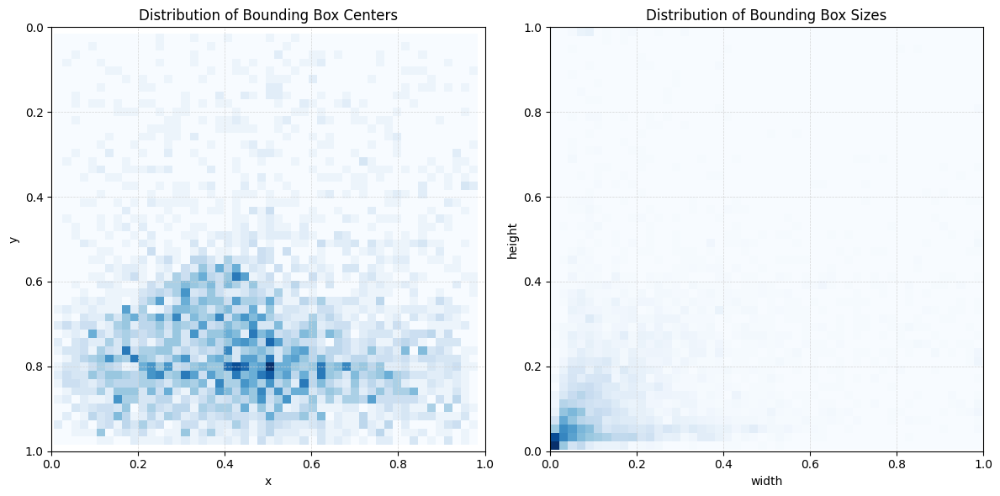

In [ ]:
visualize_distributions(train_images)